# **Generating Deep Fakes**

In [ ]:
# lets download thev data and source code.

import os
if not os.path.exists('Faceswap-Deepfake-Pytorch'):
    !wget -q https://www.dropbox.com/s/5ji7jl7httso9ny/person_images.zip
    !wget -q https://raw.githubusercontent.com/sizhky/deep-fake-util/main/random_warp.py
    !unzip -q person_images.zip
!pip install -q torch_snippets torch_summary
from torch_snippets import *
from random_warp import get_training_data

replace personA/1_0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


2021-08-06 07:36:07.164 | WARNING  | torch_snippets.torch_loader:<module>:233 - Error: No module named 'pytorch_lightning'
Not importing Lightning Report
2021-08-06 07:36:07.500 | WARNING  | torch_snippets:<module>:14 - sklearn is not found. Skipping relevant imports from submodule `sklegos`
Exception: No module named 'sklego'


# Fetch face crops from the images..

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +  'haarcascade_frontalface_default.xml')

In [ ]:
def crop_face(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray,1.3,5)
    if (len(faces)>0):
        for (x,y,w,h) in faces:
            img2 = img[y:(y+h),x:(x+w),:]
        img2 = cv2.resize(img2,(256,256))
        return img2,True
    else:
        return img,False

crop the images of personA and person B and place them in separate folders..

In [ ]:
!mkdir cropped_faces_personA
!mkdir cropped_faces_personB

def crop_images(folder):
    images = Glob(folder+'/*.jpg')
    for i in range(len(images)):
        img = read(images[i],1)
        img2, face_detected = crop_face(img)
        if(face_detected==False):
            continue
        else:
            cv2.imwrite('cropped_faces_'+folder+'/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
crop_images('personA')
crop_images('personB')

mkdir: cannot create directory ‘cropped_faces_personA’: File exists
mkdir: cannot create directory ‘cropped_faces_personB’: File exists


2021-08-06 07:36:07.803 | INFO     | torch_snippets.paths:inner:23 - 444 files found at personA/*.jpg
2021-08-06 07:36:14.706 | INFO     | torch_snippets.paths:inner:23 - 265 files found at personB/*.jpg


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, items_A, items_B):
        self.items_A = np.concatenate([read(f,1)[None] for f in items_A])/255.
        self.items_B = np.concatenate([read(f,1)[None] for f in items_B])/255.
        self.items_A += self.items_B.mean(axis=(0, 1, 2)) - self.items_A.mean(axis=(0, 1, 2))

    def __len__(self):
        return min(len(self.items_A), len(self.items_B))
    def __getitem__(self, ix):
        a, b = choose(self.items_A), choose(self.items_B)
        return a, b

    def collate_fn(self, batch):
        imsA, imsB = list(zip(*batch))
        imsA, targetA = get_training_data(imsA, len(imsA))
        imsB, targetB = get_training_data(imsB, len(imsB))
        imsA, imsB, targetA, targetB = [torch.Tensor(i).permute(0,3,1,2).to(device) for i in [imsA, imsB, targetA, targetB]]
        return imsA, imsB, targetA, targetB

a = ImageDataset(Glob('cropped_faces_personA'), Glob('cropped_faces_personB'))
x = DataLoader(a, batch_size=32, collate_fn=a.collate_fn)

2021-08-06 07:36:18.657 | INFO     | torch_snippets.paths:inner:23 - 349 files found at cropped_faces_personA
2021-08-06 07:36:18.662 | INFO     | torch_snippets.paths:inner:23 - 105 files found at cropped_faces_personB


Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: -0.003	Max: 0.883	Mean: 0.508	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: 0.027	Max: 0.930	Mean: 0.494	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: -0.003	Max: 0.885	Mean: 0.508	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: 0.024	Max: 0.930	Mean: 0.497	dtype: torch.float32


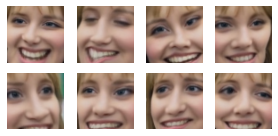

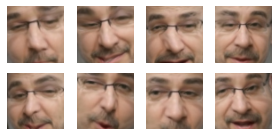

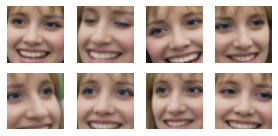

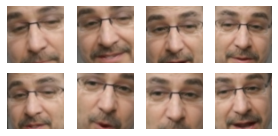

In [ ]:
#  lets inspect a few images..

inspect(*next(iter(x)))
for i in next(iter(x)):
    subplots(i[:8], nc=4,sz=(4,2))

In [ ]:
# define the conv_layer and upscaling function.

def _ConvLayer(input_features, output_features):
    return nn.Sequential(
        nn.Conv2d(input_features, output_features, kernel_size=5, stride=2, padding=2),
        nn.LeakyReLU(0.1, inplace=True)
    )

def _UpScale(input_features, output_features):
    return nn.Sequential(
        nn.ConvTranspose2d(input_features, output_features, kernel_size=2, stride=2, padding=0),
        nn.LeakyReLU(0.1, inplace=True)
    )

class Reshape(nn.Module):
    def forward(self, input):
        output = input.view(-1, 1024, 4, 4) # channel * 4 * 4
        return output

In [ ]:
# define the autoencoder model class, which has a single encoder and two decoders(decoder_A and decoder_B)
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        self.encoder = nn.Sequential(
            _ConvLayer(3, 128),
            _ConvLayer(128, 256),
            _ConvLayer(256, 512),
            _ConvLayer(512, 1024),
            nn.Flatten(),
            nn.Linear(1024 * 4 * 4, 1024),
            nn.Linear(1024, 1024 * 4 * 4),
            Reshape(),
            _UpScale(1024, 512),
        )

        self.decoder_A = nn.Sequential(
            _UpScale(512, 256),
            _UpScale(256, 128),
            _UpScale(128, 64),
            nn.Conv2d(64, 3, kernel_size=3, padding=1),
            nn.Sigmoid(),
        )

        self.decoder_B = nn.Sequential(
            _UpScale(512, 256),
            _UpScale(256, 128),
            _UpScale(128, 64),
            nn.Conv2d(64, 3, kernel_size=3, padding=1),
            nn.Sigmoid(),
        )

    def forward(self, x, select='A'):
        if select == 'A':
            out = self.encoder(x)
            out = self.decoder_A(out)
        else:
            out = self.encoder(x)
            out = self.decoder_B(out)
        return out

In [ ]:
# Generate a summary of the model
from torchsummary import summary
model = Autoencoder()
summary(model, torch.zeros(32,3,64,64), 'A');

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 8, 8]           --
|    └─Sequential: 2-1                   [-1, 128, 32, 32]         --
|    |    └─Conv2d: 3-1                  [-1, 128, 32, 32]         9,728
|    |    └─LeakyReLU: 3-2               [-1, 128, 32, 32]         --
|    └─Sequential: 2-2                   [-1, 256, 16, 16]         --
|    |    └─Conv2d: 3-3                  [-1, 256, 16, 16]         819,456
|    |    └─LeakyReLU: 3-4               [-1, 256, 16, 16]         --
|    └─Sequential: 2-3                   [-1, 512, 8, 8]           --
|    |    └─Conv2d: 3-5                  [-1, 512, 8, 8]           3,277,312
|    |    └─LeakyReLU: 3-6               [-1, 512, 8, 8]           --
|    └─Sequential: 2-4                   [-1, 1024, 4, 4]          --
|    |    └─Conv2d: 3-7                  [-1, 1024, 4, 4]          13,108,224
|    |    └─LeakyReLU: 3-8               [-1, 1024, 4, 4]     

In [ ]:
def train_batch(model, data, criterion, optimizes):
    optA, optB = optimizers
    optA.zero_grad()
    optB.zero_grad()
    imgA, imgB, targetA, targetB = data
    _imgA, _imgB = model(imgA, 'A'), model(imgB, 'B')

    lossA = criterion(_imgA, targetA)
    lossB = criterion(_imgB, targetB)
    
    lossA.backward()
    lossB.backward()

    optA.step()
    optB.step()

    return lossA.item(), lossB.item()

In [ ]:
model = Autoencoder().to(device)
dataset = ImageDataset(Glob('cropped_faces_personA'), Glob('cropped_faces_personB'))
dataloader = DataLoader(dataset, 32, collate_fn=dataset.collate_fn)

optimizers = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_A.parameters()}],
                        lr=5e-5, betas=(0.5, 0.999)), \
             optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_B.parameters()}], 
                        lr=5e-5, betas=(0.5, 0.999))
             
criterion = nn.L1Loss()

2021-08-06 07:40:17.131 | INFO     | torch_snippets.paths:inner:23 - 349 files found at cropped_faces_personA
2021-08-06 07:40:17.136 | INFO     | torch_snippets.paths:inner:23 - 105 files found at cropped_faces_personB


mkdir: cannot create directory ‘checkpoint’: File exists
EPOCH: 1.000	lossA: 0.138	lossB: 0.143	(1.35s - 13526.52s remaining)
EPOCH: 2.000	lossA: 0.137	lossB: 0.142	(2.42s - 12083.61s remaining)
EPOCH: 3.000	lossA: 0.134	lossB: 0.137	(3.45s - 11502.51s remaining)
EPOCH: 4.000	lossA: 0.118	lossB: 0.120	(4.51s - 11272.63s remaining)
EPOCH: 5.000	lossA: 0.102	lossB: 0.109	(5.57s - 11126.97s remaining)
EPOCH: 6.000	lossA: 0.093	lossB: 0.106	(6.61s - 11015.33s remaining)
EPOCH: 7.000	lossA: 0.095	lossB: 0.103	(7.65s - 10926.34s remaining)
EPOCH: 8.000	lossA: 0.095	lossB: 0.101	(8.72s - 10890.30s remaining)
EPOCH: 9.000	lossA: 0.091	lossB: 0.102	(9.75s - 10824.90s remaining)
EPOCH: 10.000	lossA: 0.092	lossB: 0.102	(10.78s - 10766.37s remaining)
EPOCH: 11.000	lossA: 0.092	lossB: 0.097	(11.82s - 10733.53s remaining)
EPOCH: 12.000	lossA: 0.089	lossB: 0.103	(12.88s - 10721.83s remaining)
EPOCH: 13.000	lossA: 0.091	lossB: 0.098	(13.93s - 10702.68s remaining)
EPOCH: 14.000	lossA: 0.091	lossB: 0.10

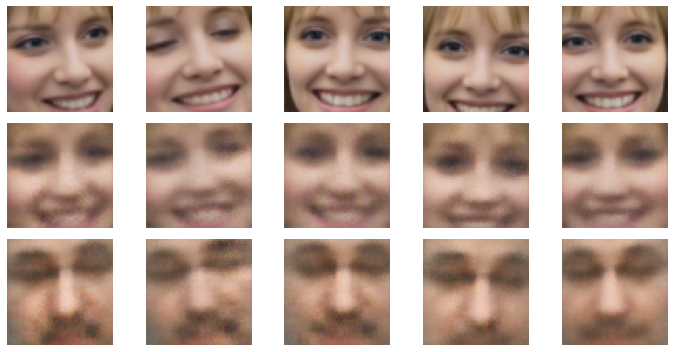

==============================B TO A==============================


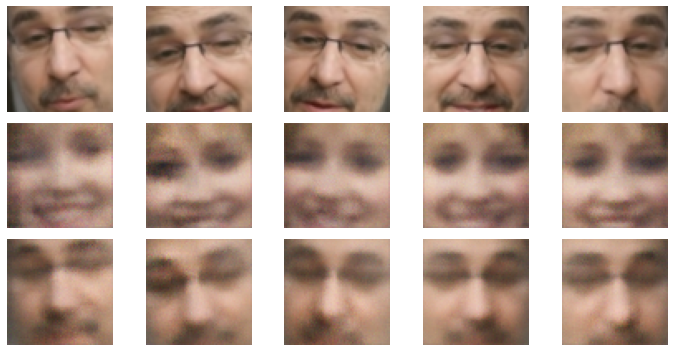

EPOCH: 101.000	lossA: 0.060	lossB: 0.048	(110.03s - 10783.94s remaining)
EPOCH: 102.000	lossA: 0.059	lossB: 0.050	(111.11s - 10782.08s remaining)
EPOCH: 103.000	lossA: 0.061	lossB: 0.050	(112.19s - 10780.46s remaining)
EPOCH: 104.000	lossA: 0.059	lossB: 0.050	(113.29s - 10780.45s remaining)
EPOCH: 105.000	lossA: 0.059	lossB: 0.050	(114.39s - 10779.44s remaining)
EPOCH: 106.000	lossA: 0.058	lossB: 0.048	(115.48s - 10778.68s remaining)
EPOCH: 107.000	lossA: 0.059	lossB: 0.049	(116.57s - 10777.49s remaining)
EPOCH: 108.000	lossA: 0.058	lossB: 0.049	(117.66s - 10776.78s remaining)
EPOCH: 109.000	lossA: 0.059	lossB: 0.050	(118.76s - 10776.55s remaining)
EPOCH: 110.000	lossA: 0.056	lossB: 0.050	(119.85s - 10775.84s remaining)
EPOCH: 111.000	lossA: 0.056	lossB: 0.046	(120.94s - 10774.39s remaining)
EPOCH: 112.000	lossA: 0.059	lossB: 0.050	(122.04s - 10773.96s remaining)
EPOCH: 113.000	lossA: 0.059	lossB: 0.050	(123.12s - 10772.54s remaining)
EPOCH: 114.000	lossA: 0.058	lossB: 0.047	(124.22s -

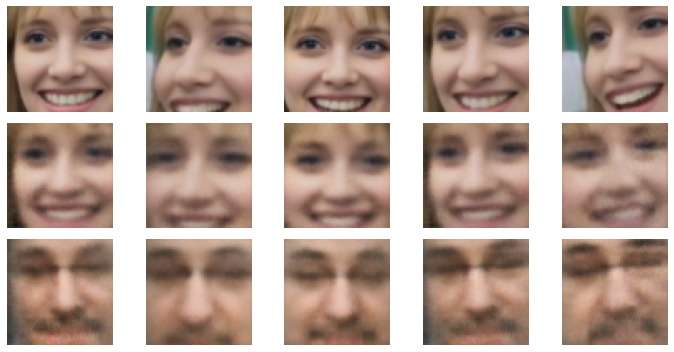

==============================B TO A==============================


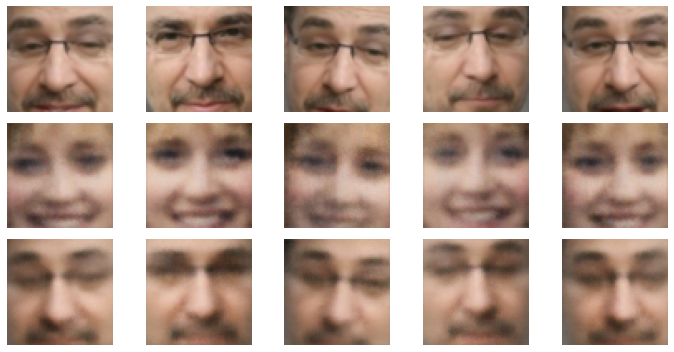

EPOCH: 201.000	lossA: 0.047	lossB: 0.039	(219.17s - 10684.58s remaining)
EPOCH: 202.000	lossA: 0.045	lossB: 0.039	(220.23s - 10682.46s remaining)
EPOCH: 203.000	lossA: 0.048	lossB: 0.039	(221.29s - 10679.88s remaining)
EPOCH: 204.000	lossA: 0.047	lossB: 0.039	(222.36s - 10677.86s remaining)
EPOCH: 205.000	lossA: 0.046	lossB: 0.039	(223.42s - 10675.05s remaining)
EPOCH: 206.000	lossA: 0.047	lossB: 0.039	(224.49s - 10672.90s remaining)
EPOCH: 207.000	lossA: 0.044	lossB: 0.038	(225.54s - 10670.18s remaining)
EPOCH: 208.000	lossA: 0.046	lossB: 0.037	(226.61s - 10668.24s remaining)
EPOCH: 209.000	lossA: 0.044	lossB: 0.039	(227.66s - 10665.17s remaining)
EPOCH: 210.000	lossA: 0.047	lossB: 0.039	(228.70s - 10661.69s remaining)
EPOCH: 211.000	lossA: 0.045	lossB: 0.038	(229.77s - 10660.01s remaining)
EPOCH: 212.000	lossA: 0.044	lossB: 0.039	(230.85s - 10658.48s remaining)
EPOCH: 213.000	lossA: 0.048	lossB: 0.039	(231.97s - 10658.53s remaining)
EPOCH: 214.000	lossA: 0.043	lossB: 0.039	(233.09s -

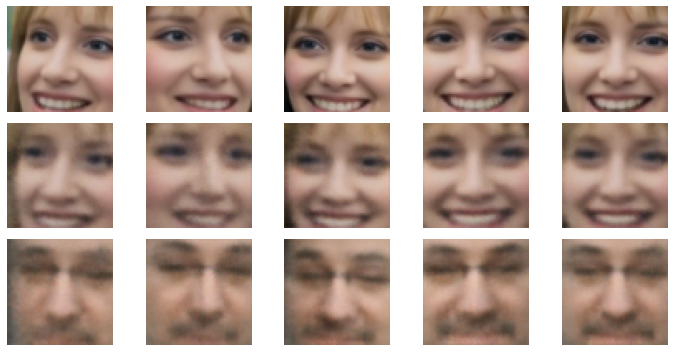

==============================B TO A==============================


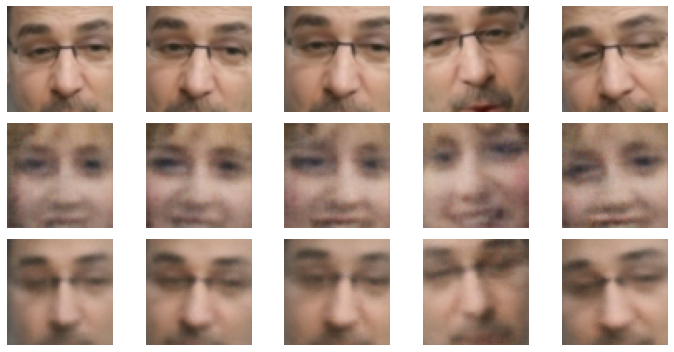

EPOCH: 301.000	lossA: 0.041	lossB: 0.034	(329.55s - 10618.82s remaining)
EPOCH: 302.000	lossA: 0.039	lossB: 0.034	(330.62s - 10617.21s remaining)
EPOCH: 303.000	lossA: 0.041	lossB: 0.033	(331.72s - 10616.14s remaining)
EPOCH: 304.000	lossA: 0.039	lossB: 0.034	(332.84s - 10615.75s remaining)
EPOCH: 305.000	lossA: 0.039	lossB: 0.032	(333.94s - 10614.84s remaining)
EPOCH: 306.000	lossA: 0.039	lossB: 0.036	(335.05s - 10614.21s remaining)
EPOCH: 307.000	lossA: 0.041	lossB: 0.034	(336.16s - 10613.53s remaining)
EPOCH: 308.000	lossA: 0.038	lossB: 0.034	(337.25s - 10612.54s remaining)
EPOCH: 309.000	lossA: 0.040	lossB: 0.034	(338.36s - 10611.75s remaining)
EPOCH: 310.000	lossA: 0.040	lossB: 0.034	(339.45s - 10610.64s remaining)
EPOCH: 311.000	lossA: 0.038	lossB: 0.033	(340.57s - 10610.14s remaining)
EPOCH: 312.000	lossA: 0.039	lossB: 0.033	(341.68s - 10609.60s remaining)
EPOCH: 313.000	lossA: 0.043	lossB: 0.035	(342.79s - 10608.85s remaining)
EPOCH: 314.000	lossA: 0.039	lossB: 0.035	(343.90s -

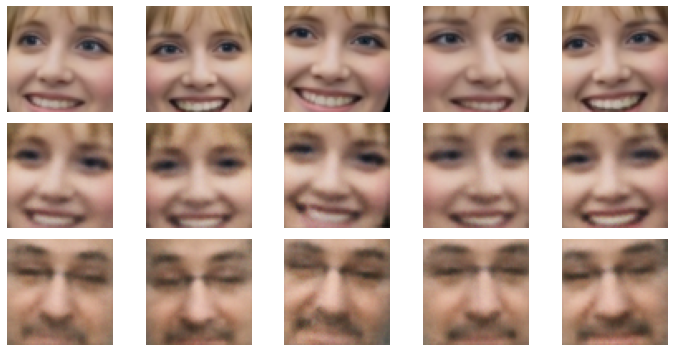

==============================B TO A==============================


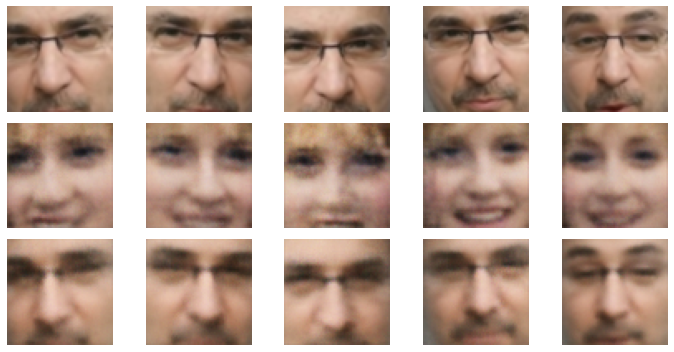

EPOCH: 401.000	lossA: 0.036	lossB: 0.032	(440.30s - 10539.66s remaining)
EPOCH: 402.000	lossA: 0.036	lossB: 0.033	(441.37s - 10538.02s remaining)
EPOCH: 403.000	lossA: 0.037	lossB: 0.032	(442.46s - 10536.72s remaining)
EPOCH: 404.000	lossA: 0.038	lossB: 0.030	(443.53s - 10534.84s remaining)
EPOCH: 405.000	lossA: 0.037	lossB: 0.032	(444.60s - 10533.30s remaining)
EPOCH: 406.000	lossA: 0.036	lossB: 0.031	(445.68s - 10531.55s remaining)
EPOCH: 407.000	lossA: 0.034	lossB: 0.032	(446.75s - 10529.84s remaining)
EPOCH: 408.000	lossA: 0.035	lossB: 0.032	(447.82s - 10528.21s remaining)
EPOCH: 409.000	lossA: 0.036	lossB: 0.032	(448.90s - 10526.56s remaining)
EPOCH: 410.000	lossA: 0.038	lossB: 0.030	(449.96s - 10524.61s remaining)
EPOCH: 411.000	lossA: 0.037	lossB: 0.032	(451.02s - 10522.59s remaining)
EPOCH: 412.000	lossA: 0.036	lossB: 0.031	(452.08s - 10520.83s remaining)
EPOCH: 413.000	lossA: 0.037	lossB: 0.031	(453.16s - 10519.21s remaining)
EPOCH: 414.000	lossA: 0.035	lossB: 0.030	(454.22s -

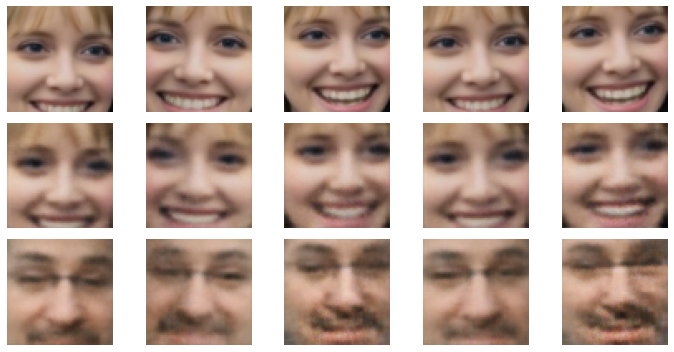

==============================B TO A==============================


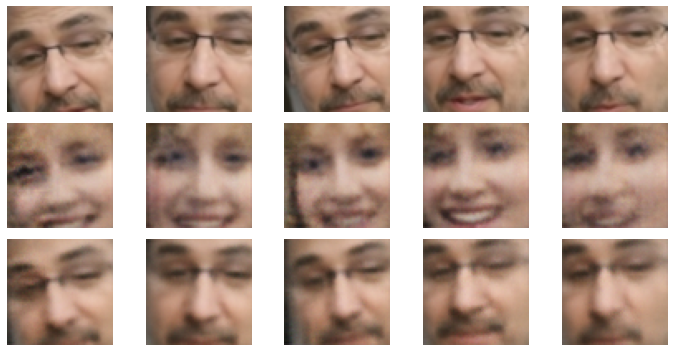

EPOCH: 501.000	lossA: 0.035	lossB: 0.030	(551.15s - 10449.87s remaining)
EPOCH: 502.000	lossA: 0.033	lossB: 0.031	(552.24s - 10448.57s remaining)
EPOCH: 503.000	lossA: 0.034	lossB: 0.029	(553.36s - 10447.91s remaining)
EPOCH: 504.000	lossA: 0.032	lossB: 0.028	(554.46s - 10446.69s remaining)
EPOCH: 505.000	lossA: 0.032	lossB: 0.029	(555.52s - 10444.92s remaining)
EPOCH: 506.000	lossA: 0.036	lossB: 0.030	(556.59s - 10443.31s remaining)
EPOCH: 507.000	lossA: 0.033	lossB: 0.029	(557.68s - 10441.86s remaining)
EPOCH: 508.000	lossA: 0.032	lossB: 0.029	(558.74s - 10440.13s remaining)
EPOCH: 509.000	lossA: 0.034	lossB: 0.030	(559.81s - 10438.47s remaining)
EPOCH: 510.000	lossA: 0.035	lossB: 0.030	(560.89s - 10436.98s remaining)
EPOCH: 511.000	lossA: 0.034	lossB: 0.030	(561.98s - 10435.71s remaining)
EPOCH: 512.000	lossA: 0.033	lossB: 0.029	(563.04s - 10433.84s remaining)
EPOCH: 513.000	lossA: 0.033	lossB: 0.029	(564.10s - 10432.07s remaining)
EPOCH: 514.000	lossA: 0.032	lossB: 0.028	(565.17s -

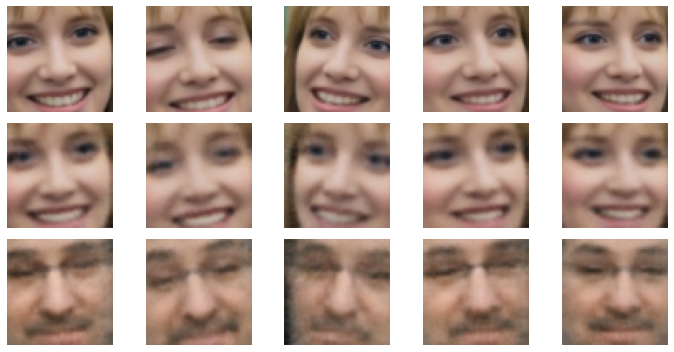

==============================B TO A==============================


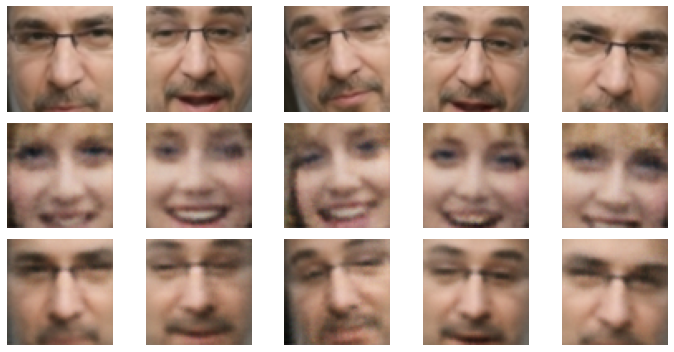

EPOCH: 601.000	lossA: 0.032	lossB: 0.027	(662.28s - 10357.38s remaining)
EPOCH: 602.000	lossA: 0.034	lossB: 0.029	(663.38s - 10356.16s remaining)
EPOCH: 603.000	lossA: 0.032	lossB: 0.029	(664.45s - 10354.65s remaining)
EPOCH: 604.000	lossA: 0.032	lossB: 0.028	(665.54s - 10353.29s remaining)
EPOCH: 605.000	lossA: 0.031	lossB: 0.028	(666.61s - 10351.71s remaining)
EPOCH: 606.000	lossA: 0.032	lossB: 0.028	(667.70s - 10350.42s remaining)
EPOCH: 607.000	lossA: 0.033	lossB: 0.028	(668.77s - 10348.84s remaining)
EPOCH: 608.000	lossA: 0.032	lossB: 0.029	(669.83s - 10347.09s remaining)
EPOCH: 609.000	lossA: 0.031	lossB: 0.027	(670.90s - 10345.58s remaining)
EPOCH: 610.000	lossA: 0.032	lossB: 0.028	(671.98s - 10344.08s remaining)
EPOCH: 611.000	lossA: 0.033	lossB: 0.027	(673.04s - 10342.34s remaining)
EPOCH: 612.000	lossA: 0.030	lossB: 0.027	(674.11s - 10340.82s remaining)
EPOCH: 613.000	lossA: 0.032	lossB: 0.027	(675.18s - 10339.17s remaining)
EPOCH: 614.000	lossA: 0.033	lossB: 0.026	(676.24s -

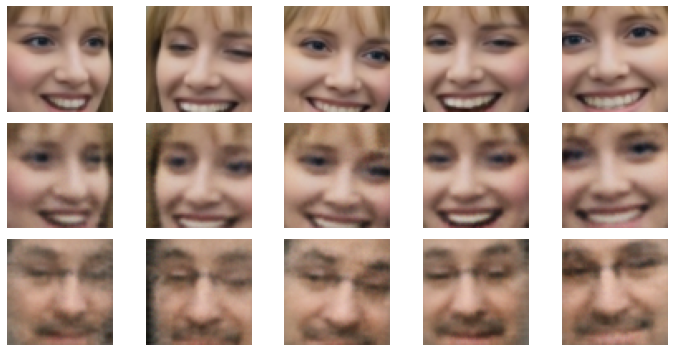

==============================B TO A==============================


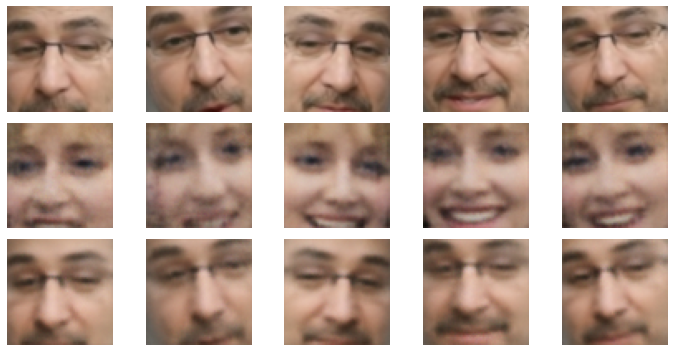

EPOCH: 701.000	lossA: 0.032	lossB: 0.026	(773.03s - 10254.44s remaining)
EPOCH: 702.000	lossA: 0.030	lossB: 0.027	(774.13s - 10253.40s remaining)
EPOCH: 703.000	lossA: 0.031	lossB: 0.027	(775.25s - 10252.49s remaining)
EPOCH: 704.000	lossA: 0.030	lossB: 0.027	(776.36s - 10251.46s remaining)
EPOCH: 705.000	lossA: 0.030	lossB: 0.026	(777.47s - 10250.52s remaining)
EPOCH: 706.000	lossA: 0.030	lossB: 0.027	(778.57s - 10249.36s remaining)
EPOCH: 707.000	lossA: 0.032	lossB: 0.027	(779.68s - 10248.37s remaining)
EPOCH: 708.000	lossA: 0.031	lossB: 0.027	(780.78s - 10247.25s remaining)
EPOCH: 709.000	lossA: 0.032	lossB: 0.027	(781.89s - 10246.18s remaining)
EPOCH: 710.000	lossA: 0.031	lossB: 0.026	(783.00s - 10245.18s remaining)
EPOCH: 711.000	lossA: 0.031	lossB: 0.028	(784.14s - 10244.49s remaining)
EPOCH: 712.000	lossA: 0.030	lossB: 0.028	(785.25s - 10243.48s remaining)
EPOCH: 713.000	lossA: 0.031	lossB: 0.027	(786.32s - 10241.97s remaining)
EPOCH: 714.000	lossA: 0.030	lossB: 0.026	(787.40s -

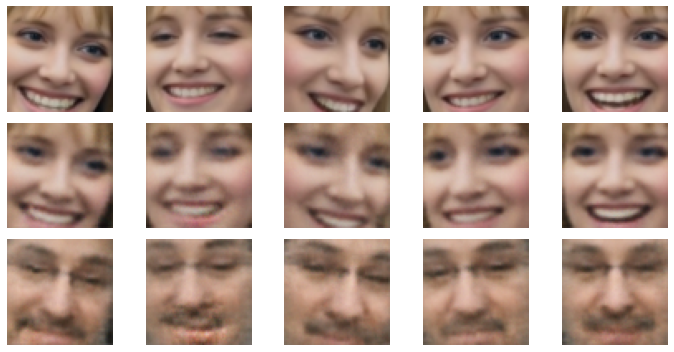

==============================B TO A==============================


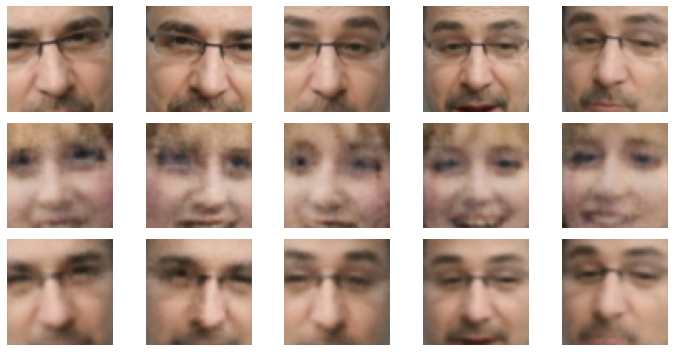

EPOCH: 801.000	lossA: 0.028	lossB: 0.026	(884.41s - 10156.94s remaining)
EPOCH: 802.000	lossA: 0.028	lossB: 0.026	(885.49s - 10155.56s remaining)
EPOCH: 803.000	lossA: 0.029	lossB: 0.026	(886.58s - 10154.28s remaining)
EPOCH: 804.000	lossA: 0.030	lossB: 0.026	(887.67s - 10153.01s remaining)
EPOCH: 805.000	lossA: 0.030	lossB: 0.026	(888.76s - 10151.76s remaining)
EPOCH: 806.000	lossA: 0.029	lossB: 0.026	(889.84s - 10150.34s remaining)
EPOCH: 807.000	lossA: 0.030	lossB: 0.026	(890.91s - 10148.81s remaining)
EPOCH: 808.000	lossA: 0.030	lossB: 0.025	(891.96s - 10147.19s remaining)
EPOCH: 809.000	lossA: 0.029	lossB: 0.025	(893.09s - 10146.29s remaining)
EPOCH: 810.000	lossA: 0.031	lossB: 0.027	(894.20s - 10145.34s remaining)
EPOCH: 811.000	lossA: 0.029	lossB: 0.026	(895.34s - 10144.60s remaining)
EPOCH: 812.000	lossA: 0.029	lossB: 0.026	(896.48s - 10143.86s remaining)
EPOCH: 813.000	lossA: 0.029	lossB: 0.025	(897.62s - 10143.21s remaining)
EPOCH: 814.000	lossA: 0.029	lossB: 0.025	(898.73s -

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


==============================A TO B==============================


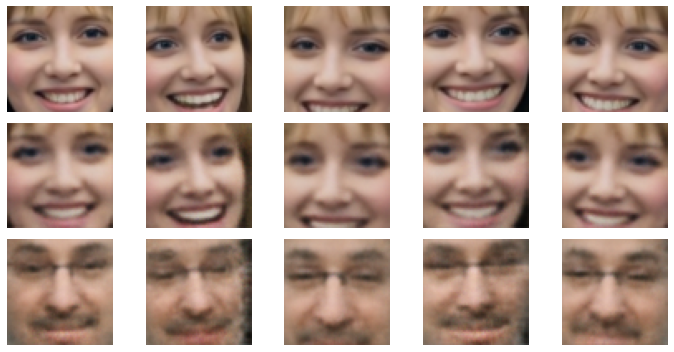

==============================B TO A==============================


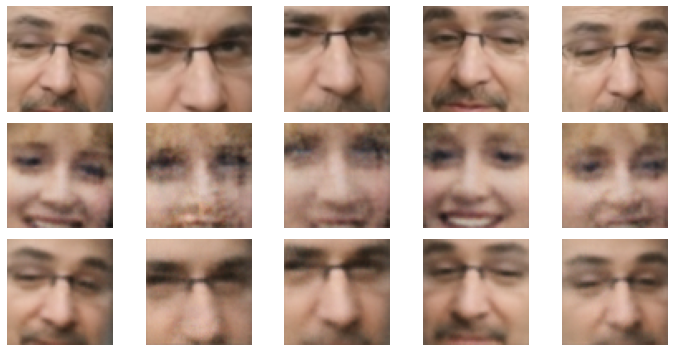

EPOCH: 901.000	lossA: 0.028	lossB: 0.025	(997.61s - 10074.65s remaining)
EPOCH: 902.000	lossA: 0.028	lossB: 0.024	(998.73s - 10073.68s remaining)
EPOCH: 903.000	lossA: 0.029	lossB: 0.026	(999.85s - 10072.66s remaining)
EPOCH: 904.000	lossA: 0.028	lossB: 0.027	(1000.99s - 10071.91s remaining)
EPOCH: 905.000	lossA: 0.029	lossB: 0.024	(1002.13s - 10071.10s remaining)
EPOCH: 906.000	lossA: 0.027	lossB: 0.026	(1003.25s - 10070.15s remaining)
EPOCH: 907.000	lossA: 0.028	lossB: 0.024	(1004.37s - 10069.16s remaining)
EPOCH: 908.000	lossA: 0.029	lossB: 0.024	(1005.51s - 10068.40s remaining)
EPOCH: 909.000	lossA: 0.030	lossB: 0.025	(1006.64s - 10067.46s remaining)
EPOCH: 910.000	lossA: 0.028	lossB: 0.025	(1007.75s - 10066.44s remaining)
EPOCH: 911.000	lossA: 0.027	lossB: 0.024	(1008.89s - 10065.62s remaining)
EPOCH: 912.000	lossA: 0.028	lossB: 0.026	(1010.02s - 10064.76s remaining)
EPOCH: 913.000	lossA: 0.029	lossB: 0.025	(1011.13s - 10063.67s remaining)
EPOCH: 914.000	lossA: 0.027	lossB: 0.025	

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


==============================A TO B==============================


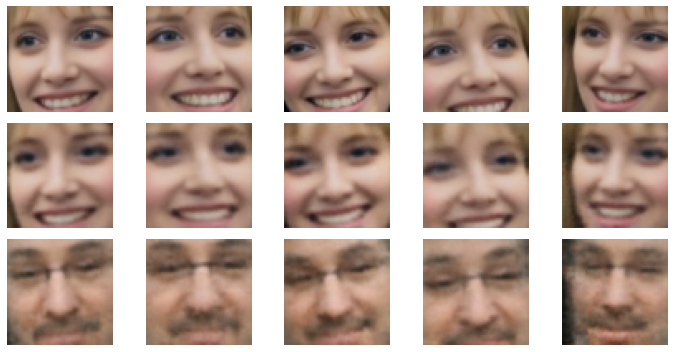

==============================B TO A==============================


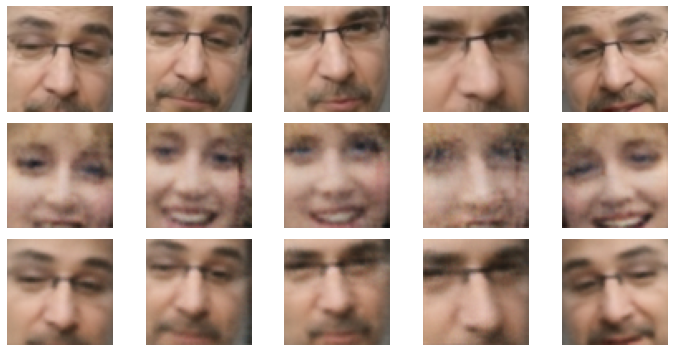

EPOCH: 1001.000	lossA: 0.026	lossB: 0.024	(1109.77s - 9976.86s remaining)
EPOCH: 1002.000	lossA: 0.028	lossB: 0.024	(1110.87s - 9975.68s remaining)
EPOCH: 1003.000	lossA: 0.028	lossB: 0.025	(1111.96s - 9974.35s remaining)
EPOCH: 1004.000	lossA: 0.028	lossB: 0.024	(1113.03s - 9972.90s remaining)
EPOCH: 1005.000	lossA: 0.026	lossB: 0.023	(1114.10s - 9971.47s remaining)
EPOCH: 1006.000	lossA: 0.029	lossB: 0.025	(1115.17s - 9969.98s remaining)
EPOCH: 1007.000	lossA: 0.027	lossB: 0.025	(1116.26s - 9968.73s remaining)
EPOCH: 1008.000	lossA: 0.028	lossB: 0.024	(1117.37s - 9967.66s remaining)
EPOCH: 1009.000	lossA: 0.028	lossB: 0.024	(1118.45s - 9966.32s remaining)
EPOCH: 1010.000	lossA: 0.027	lossB: 0.025	(1119.55s - 9965.08s remaining)
EPOCH: 1011.000	lossA: 0.028	lossB: 0.024	(1120.62s - 9963.64s remaining)
EPOCH: 1012.000	lossA: 0.028	lossB: 0.024	(1121.69s - 9962.24s remaining)
EPOCH: 1013.000	lossA: 0.027	lossB: 0.024	(1122.79s - 9961.04s remaining)
EPOCH: 1014.000	lossA: 0.029	lossB: 0.

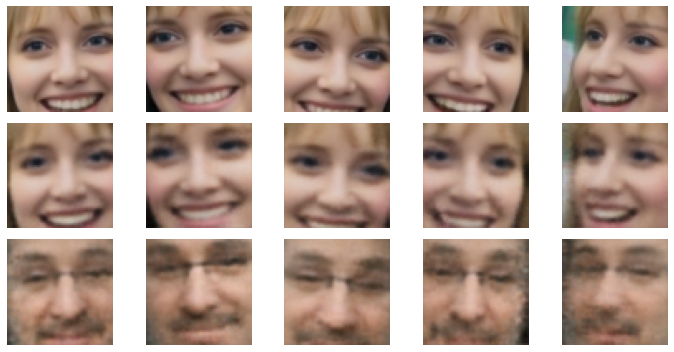

==============================B TO A==============================


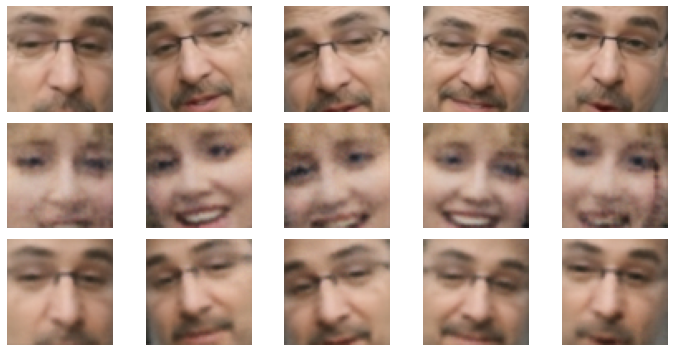

EPOCH: 1101.000	lossA: 0.026	lossB: 0.024	(1222.77s - 9883.21s remaining)
EPOCH: 1102.000	lossA: 0.025	lossB: 0.024	(1223.87s - 9882.01s remaining)
EPOCH: 1103.000	lossA: 0.026	lossB: 0.022	(1224.97s - 9880.80s remaining)
EPOCH: 1104.000	lossA: 0.026	lossB: 0.023	(1226.07s - 9879.62s remaining)
EPOCH: 1105.000	lossA: 0.027	lossB: 0.024	(1227.15s - 9878.31s remaining)
EPOCH: 1106.000	lossA: 0.027	lossB: 0.023	(1228.27s - 9877.25s remaining)
EPOCH: 1107.000	lossA: 0.027	lossB: 0.023	(1229.36s - 9875.93s remaining)
EPOCH: 1108.000	lossA: 0.025	lossB: 0.023	(1230.47s - 9874.84s remaining)
EPOCH: 1109.000	lossA: 0.027	lossB: 0.025	(1231.60s - 9873.88s remaining)
EPOCH: 1110.000	lossA: 0.028	lossB: 0.023	(1232.72s - 9872.88s remaining)
EPOCH: 1111.000	lossA: 0.027	lossB: 0.024	(1233.86s - 9872.00s remaining)
EPOCH: 1112.000	lossA: 0.027	lossB: 0.024	(1234.96s - 9870.78s remaining)
EPOCH: 1113.000	lossA: 0.026	lossB: 0.023	(1236.04s - 9869.45s remaining)
EPOCH: 1114.000	lossA: 0.027	lossB: 0.

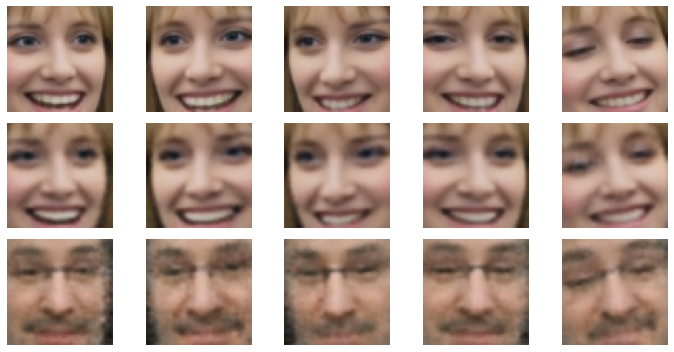

==============================B TO A==============================


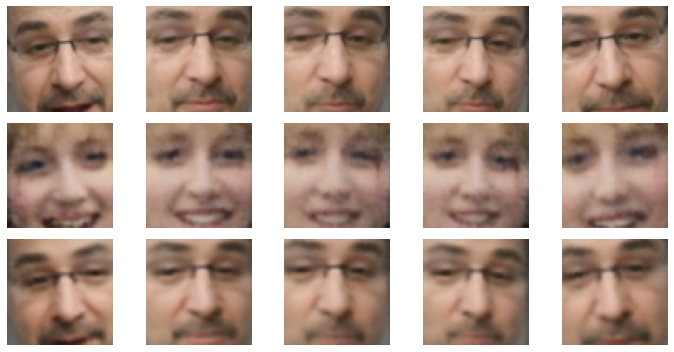

EPOCH: 1201.000	lossA: 0.026	lossB: 0.023	(1336.11s - 9788.85s remaining)
EPOCH: 1202.000	lossA: 0.027	lossB: 0.023	(1337.21s - 9787.63s remaining)
EPOCH: 1203.000	lossA: 0.027	lossB: 0.023	(1338.29s - 9786.29s remaining)
EPOCH: 1204.000	lossA: 0.026	lossB: 0.023	(1339.40s - 9785.18s remaining)
EPOCH: 1205.000	lossA: 0.025	lossB: 0.023	(1340.47s - 9783.79s remaining)
EPOCH: 1206.000	lossA: 0.026	lossB: 0.022	(1341.55s - 9782.42s remaining)
EPOCH: 1207.000	lossA: 0.026	lossB: 0.023	(1342.64s - 9781.12s remaining)
EPOCH: 1208.000	lossA: 0.026	lossB: 0.023	(1343.73s - 9779.84s remaining)
EPOCH: 1209.000	lossA: 0.025	lossB: 0.023	(1344.82s - 9778.56s remaining)
EPOCH: 1210.000	lossA: 0.025	lossB: 0.022	(1345.90s - 9777.21s remaining)
EPOCH: 1211.000	lossA: 0.025	lossB: 0.023	(1346.99s - 9775.95s remaining)
EPOCH: 1212.000	lossA: 0.025	lossB: 0.022	(1348.06s - 9774.57s remaining)
EPOCH: 1213.000	lossA: 0.026	lossB: 0.023	(1349.17s - 9773.39s remaining)
EPOCH: 1214.000	lossA: 0.025	lossB: 0.

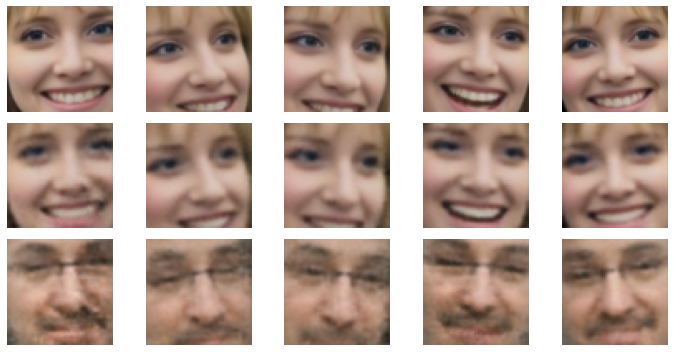

==============================B TO A==============================


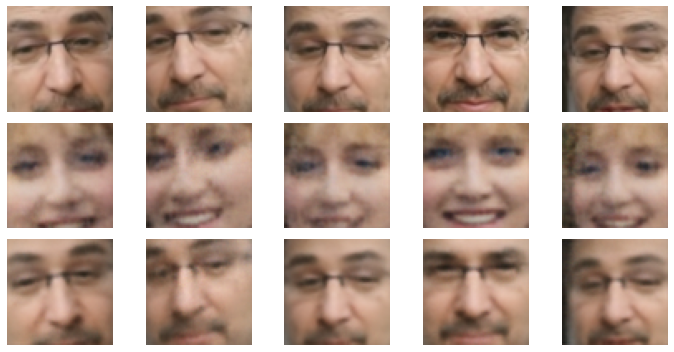

EPOCH: 1301.000	lossA: 0.025	lossB: 0.022	(1449.58s - 9692.48s remaining)
EPOCH: 1302.000	lossA: 0.025	lossB: 0.022	(1450.67s - 9691.20s remaining)
EPOCH: 1303.000	lossA: 0.026	lossB: 0.022	(1451.79s - 9690.10s remaining)
EPOCH: 1304.000	lossA: 0.025	lossB: 0.022	(1452.90s - 9688.97s remaining)
EPOCH: 1305.000	lossA: 0.026	lossB: 0.022	(1454.00s - 9687.75s remaining)
EPOCH: 1306.000	lossA: 0.026	lossB: 0.022	(1455.10s - 9686.58s remaining)
EPOCH: 1307.000	lossA: 0.026	lossB: 0.022	(1456.22s - 9685.49s remaining)
EPOCH: 1308.000	lossA: 0.025	lossB: 0.023	(1457.34s - 9684.39s remaining)
EPOCH: 1309.000	lossA: 0.026	lossB: 0.022	(1458.43s - 9683.10s remaining)
EPOCH: 1310.000	lossA: 0.026	lossB: 0.022	(1459.56s - 9682.09s remaining)
EPOCH: 1311.000	lossA: 0.025	lossB: 0.023	(1460.67s - 9680.97s remaining)
EPOCH: 1312.000	lossA: 0.024	lossB: 0.022	(1461.76s - 9679.72s remaining)
EPOCH: 1313.000	lossA: 0.025	lossB: 0.021	(1462.87s - 9678.57s remaining)
EPOCH: 1314.000	lossA: 0.026	lossB: 0.

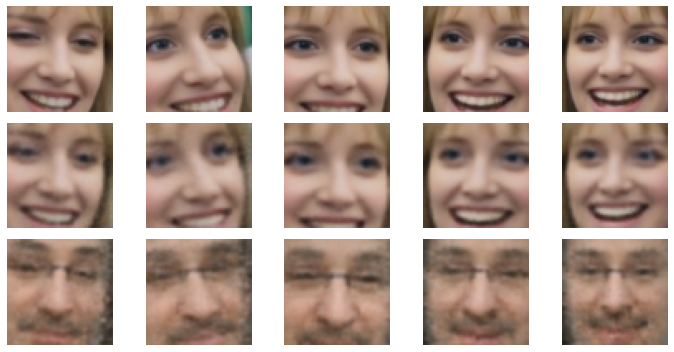

==============================B TO A==============================


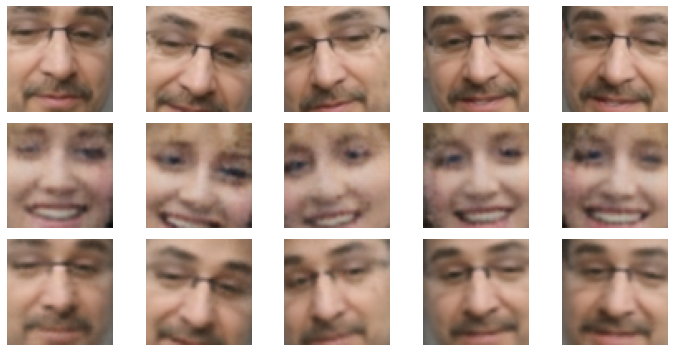

EPOCH: 1401.000	lossA: 0.025	lossB: 0.021	(1563.49s - 9596.33s remaining)
EPOCH: 1402.000	lossA: 0.024	lossB: 0.021	(1564.62s - 9595.32s remaining)
EPOCH: 1403.000	lossA: 0.025	lossB: 0.021	(1565.78s - 9594.45s remaining)
EPOCH: 1404.000	lossA: 0.024	lossB: 0.020	(1566.92s - 9593.49s remaining)
EPOCH: 1405.000	lossA: 0.024	lossB: 0.022	(1568.07s - 9592.54s remaining)
EPOCH: 1406.000	lossA: 0.024	lossB: 0.023	(1569.22s - 9591.64s remaining)
EPOCH: 1407.000	lossA: 0.025	lossB: 0.022	(1570.35s - 9590.61s remaining)
EPOCH: 1408.000	lossA: 0.025	lossB: 0.021	(1571.48s - 9589.60s remaining)
EPOCH: 1409.000	lossA: 0.024	lossB: 0.021	(1572.61s - 9588.59s remaining)
EPOCH: 1410.000	lossA: 0.025	lossB: 0.021	(1573.76s - 9587.64s remaining)
EPOCH: 1411.000	lossA: 0.026	lossB: 0.021	(1574.90s - 9586.69s remaining)
EPOCH: 1412.000	lossA: 0.027	lossB: 0.022	(1576.05s - 9585.78s remaining)
EPOCH: 1413.000	lossA: 0.026	lossB: 0.022	(1577.21s - 9584.93s remaining)
EPOCH: 1414.000	lossA: 0.025	lossB: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


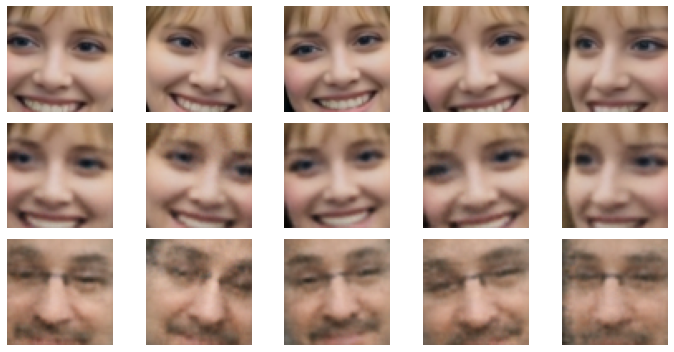

==============================B TO A==============================


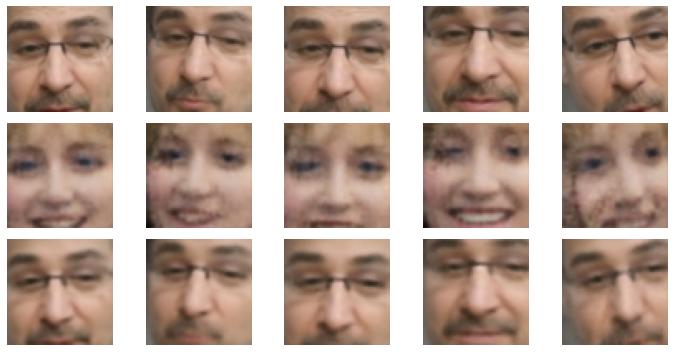

EPOCH: 1501.000	lossA: 0.024	lossB: 0.021	(1678.76s - 9505.52s remaining)
EPOCH: 1502.000	lossA: 0.025	lossB: 0.021	(1679.89s - 9504.47s remaining)
EPOCH: 1503.000	lossA: 0.024	lossB: 0.021	(1681.01s - 9503.38s remaining)
EPOCH: 1504.000	lossA: 0.025	lossB: 0.021	(1682.13s - 9502.24s remaining)
EPOCH: 1505.000	lossA: 0.023	lossB: 0.021	(1683.23s - 9501.01s remaining)
EPOCH: 1506.000	lossA: 0.023	lossB: 0.021	(1684.32s - 9499.77s remaining)
EPOCH: 1507.000	lossA: 0.023	lossB: 0.022	(1685.42s - 9498.51s remaining)
EPOCH: 1508.000	lossA: 0.024	lossB: 0.021	(1686.52s - 9497.33s remaining)
EPOCH: 1509.000	lossA: 0.025	lossB: 0.022	(1687.65s - 9496.26s remaining)
EPOCH: 1510.000	lossA: 0.025	lossB: 0.022	(1688.78s - 9495.17s remaining)
EPOCH: 1511.000	lossA: 0.024	lossB: 0.022	(1689.86s - 9493.86s remaining)
EPOCH: 1512.000	lossA: 0.023	lossB: 0.021	(1690.99s - 9492.78s remaining)
EPOCH: 1513.000	lossA: 0.023	lossB: 0.021	(1692.10s - 9491.64s remaining)
EPOCH: 1514.000	lossA: 0.025	lossB: 0.

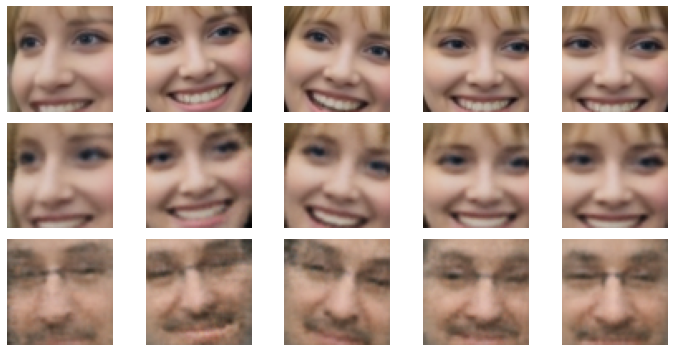

==============================B TO A==============================


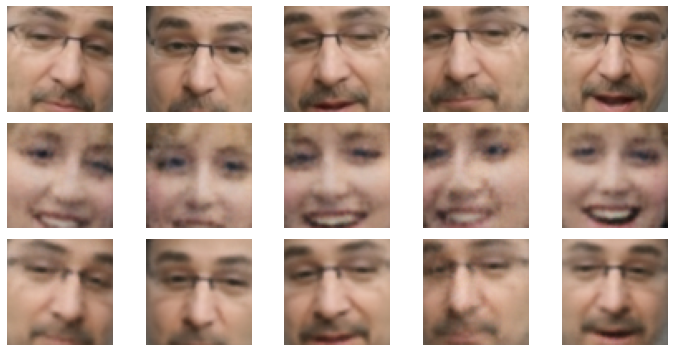

EPOCH: 1601.000	lossA: 0.024	lossB: 0.021	(1793.89s - 9410.92s remaining)
EPOCH: 1602.000	lossA: 0.025	lossB: 0.020	(1795.02s - 9409.85s remaining)
EPOCH: 1603.000	lossA: 0.023	lossB: 0.020	(1796.17s - 9408.86s remaining)
EPOCH: 1604.000	lossA: 0.024	lossB: 0.021	(1797.34s - 9408.02s remaining)
EPOCH: 1605.000	lossA: 0.024	lossB: 0.021	(1798.50s - 9407.12s remaining)
EPOCH: 1606.000	lossA: 0.024	lossB: 0.022	(1799.65s - 9406.15s remaining)


In [ ]:
n_epochs = 10000
log = Report(n_epochs)
!mkdir checkpoint
for ex in range(n_epochs):
    N = len(dataloader)
    for bx,data in enumerate(dataloader):
        lossA, lossB = train_batch(model, data, criterion, optimizers)
        log.record(ex+(1+bx)/N, lossA=lossA, lossB=lossB, end='\r')

    log.report_avgs(ex+1)
    if (ex+1)%100 == 0:
        state = {
                'state': model.state_dict(),
                'epoch': ex
            }
        torch.save(state, './checkpoint/autoencoder.pth')

    if (ex+1)%100 == 0:
        bs = 5
        a,b,A,B = data
        line('A to B')
        _a = model(a[:bs], 'A')
        _b = model(a[:bs], 'B')
        x = torch.cat([A[:bs],_a,_b])
        subplots(x, nc=bs, figsize=(bs*2, 5))

        line('B to A')
        _a = model(b[:bs], 'A')
        _b = model(b[:bs], 'B')
        x = torch.cat([B[:bs],_a,_b])
        subplots(x, nc=bs, figsize=(bs*2, 5))

log.plot_epochs()